# Pixelate
## Convert a scaled jpeg of pixel art into pixel perfect bitmap


In [294]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from matplotlib import image as pltimg
from skimage.metrics import structural_similarity
import scipy
from scipy.signal import find_peaks, peak_prominences
from scipy.stats import describe
from IPython import display
from glob import glob
import os
import PIL
import math

In [295]:
# read images from src
data = []
for f in glob("../src/usada_pekora*.png"):
    data.append(np.array(pltimg.imread(f)))

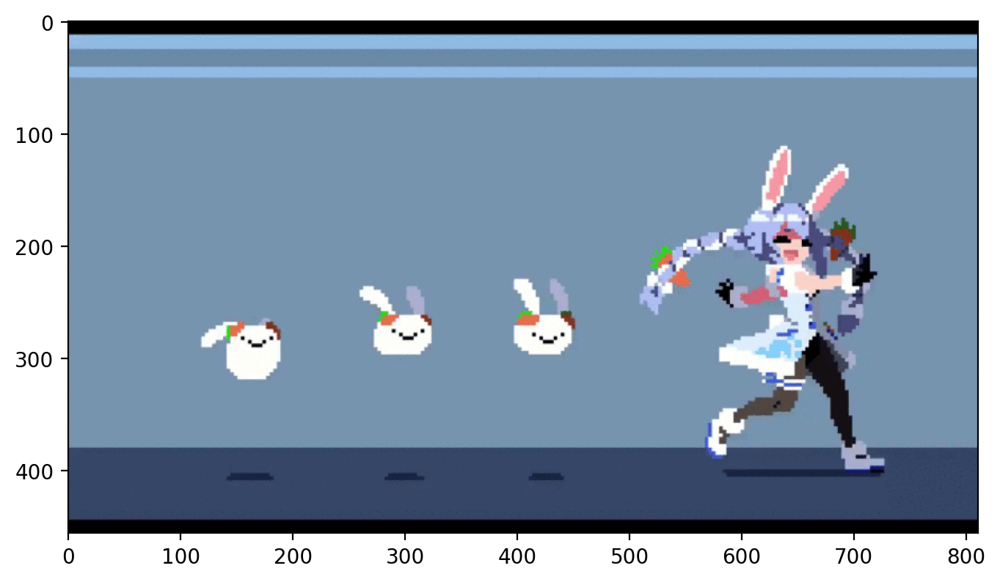

In [296]:
plt.figure(figsize=(8,8), dpi=200)
plt.imshow(data[0])

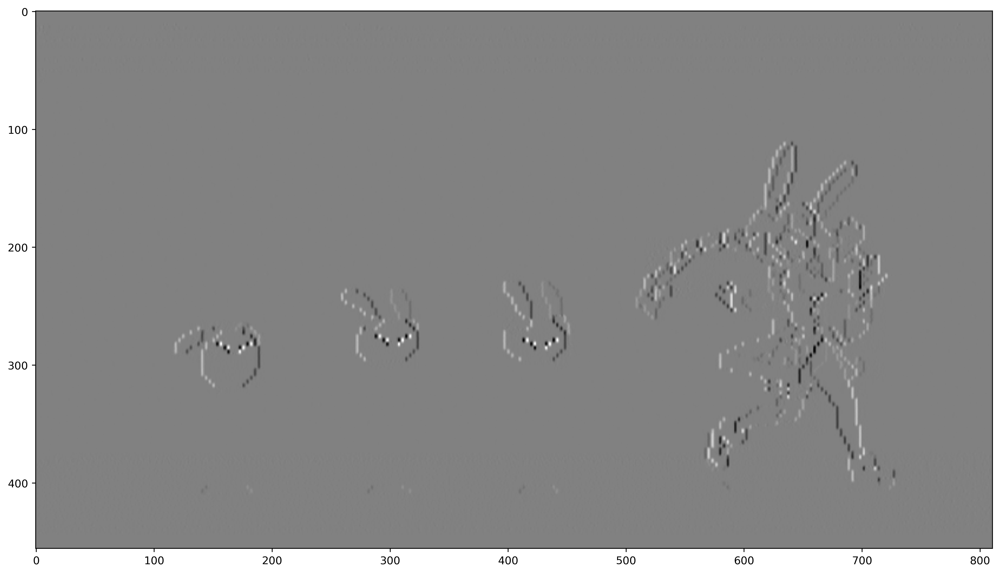

In [376]:
gray = cv.cvtColor(data[0], cv.COLOR_RGB2GRAY)
x = cv.Sobel(gray, cv.CV_32F, 1, 0, ksize=3)
y = cv.Sobel(gray, cv.CV_32F, 0, 1, ksize=3)
l = cv.Laplacian(gray, cv.CV_32F)
plt.figure(figsize=(16,16), dpi=400)
plt.imshow(x, cmap="gray")

(811,)
(456,)


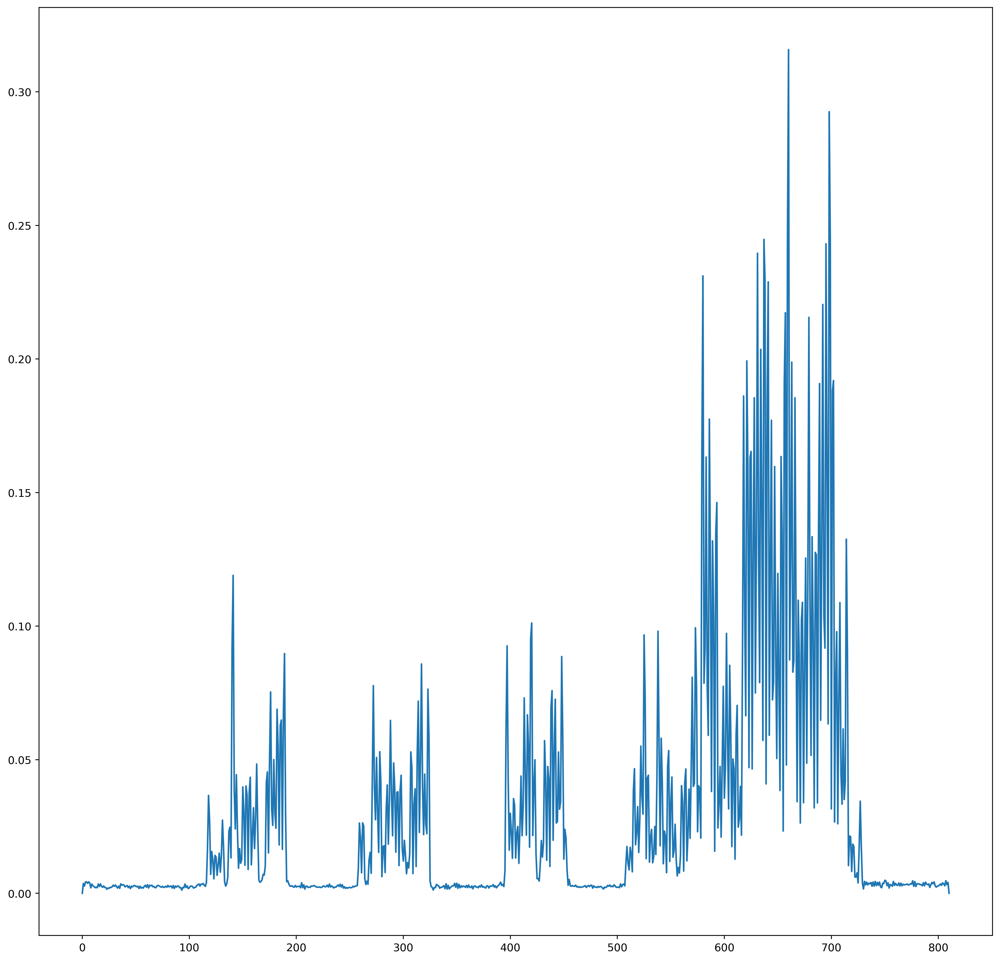

In [377]:
sx = np.mean(np.abs(x), axis=(0))
sy = np.mean(np.abs(y), axis=(1))
print(sx.shape)
print(sy.shape)
plt.figure(figsize=(16,16), dpi=400)
plt.plot(sx)

[118 121 128 131 141 144 147 150 153 157 160 163 173 176 179 182 189 259
 272 275 278 285 288 291 298 301 307 311 314 317 320 323 397 400 410 413
 416 420 423 429 432 435 439 442 445 448 451 509 516 519 522 525 532 535
 538 541 548 551 554 560 564 567 570 573 580 583 586 589 593 596 599 602
 605 608 612 615 618 621 628 631 634 637 641 644 647 650 653 657 660 663
 666 669 673 676 679 682 689 692 695 698 702 705 708 711 714 727]


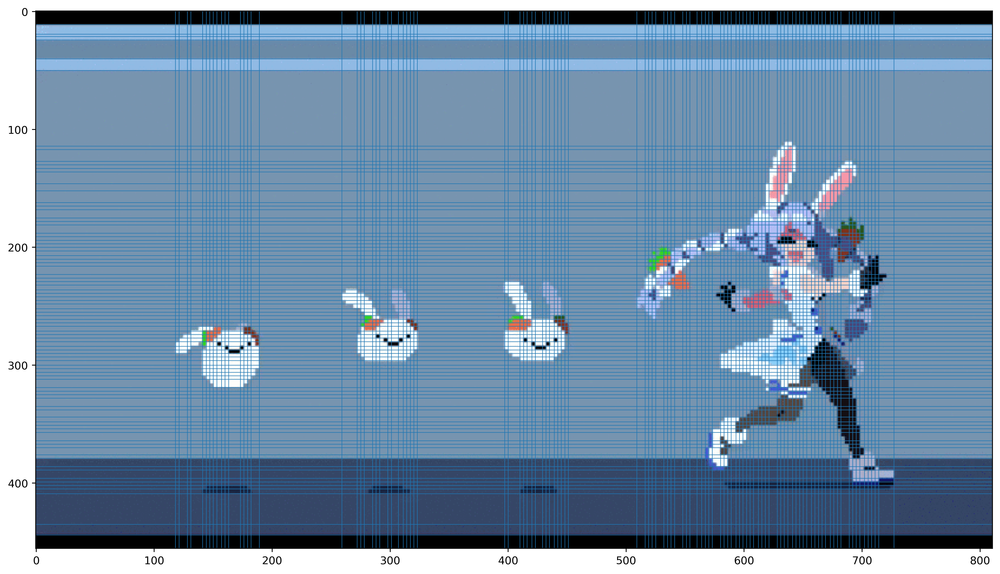

In [354]:
plt.figure(figsize=(16,16), dpi=400)
plt.imshow(data[0], cmap="gray")

px, _ = find_peaks(sx, height=0, threshold=(0.003))
print(px)
for peakx in px:
    plt.axvline(x=peakx, lw=0.5)

py, _ = find_peaks(sy, height=0, threshold=(0.003))
for peaky in py:
    plt.axhline(y=peaky,lw=0.5)


[  0 118 121 128 131 141 144 147 150 153 157 160 163 173 176 179 182 189
 259 272 275 278 285 288 291 298 301 307 311 314 317 320 323 397 400 410
 413 416 420 423 429 432 435 439 442 445 448 451 509 516 519 522 525 532
 535 538 541 548 551 554 560 564 567 570 573 580 583 586 589 593 596 599
 602 605 608 612 615 618 621 628 631 634 637 641 644 647 650 653 657 660
 663 666 669 673 676 679 682 689 692 695 698 702 705 708 711 714 727 810]
[73. 11.  0.  3.  0.] [3.         3.76666667 4.53333333 5.3        6.06666667]


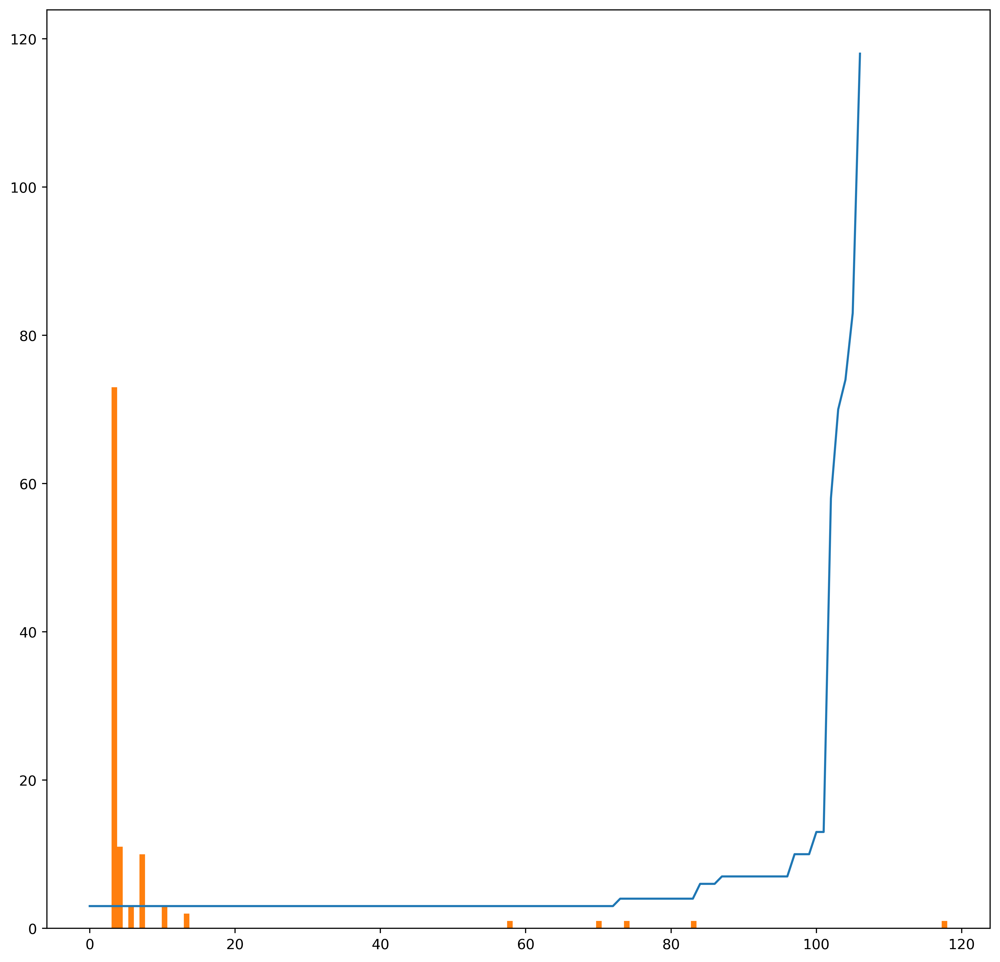

In [328]:
# determine pixel width and height from above edge detection

padded_px = np.insert(px, 0, 0)
padded_px = np.append(padded_px,width)

print(padded_px)
diff_x = np.diff(padded_px)
sorted_diff_x = sorted(diff_x)
plt.figure(figsize=(12,12), dpi=400)
plt.plot(sorted_diff_x)
freq_x, bin_x, _ = plt.hist(sorted_diff_x, bins=150)
print(freq_x[:5], bin_x[:5])

single_cell = sorted_diff_x[:int(sum(freq_x[:5]))]

In [365]:
describe(single_cell)
mean_w = np.mean(single_cell)
width = len(data[0][0])-1
print("naive division of width by mean pixel size: ", (width-1)/mean_w)

total = 0
for i in diff_x:
    print(i, round(i/mean_w))
    total += round(i/mean_w)
print(total)

naive division of width by mean pixel size:  250.47330960854092
118 37
3 1
7 2
3 1
10 3
3 1
3 1
3 1
3 1
4 1
3 1
3 1
10 3
3 1
3 1
3 1
7 2
70 22
13 4
3 1
3 1
7 2
3 1
3 1
7 2
3 1
6 2
4 1
3 1
3 1
3 1
3 1
74 23
3 1
10 3
3 1
3 1
4 1
3 1
6 2
3 1
3 1
4 1
3 1
3 1
3 1
3 1
58 18
7 2
3 1
3 1
3 1
7 2
3 1
3 1
3 1
7 2
3 1
3 1
6 2
4 1
3 1
3 1
3 1
7 2
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
7 2
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
7 2
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
13 4
83 26
253


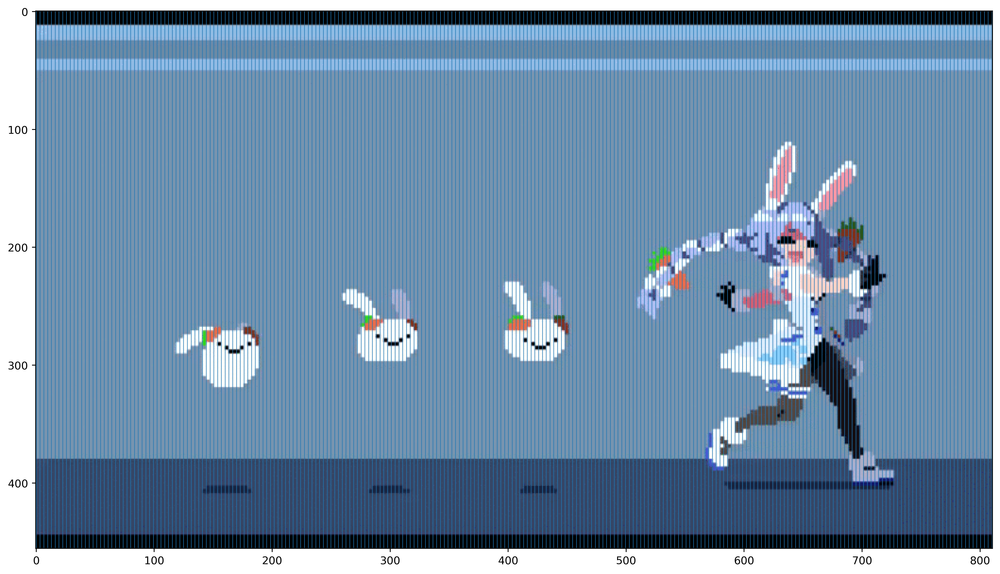

In [372]:
plt.figure(figsize=(16,16), dpi=400)
plt.imshow(data[0])

for l in np.linspace(0, width, num=total+1):
    plt.axvline(x=l,lw=0.5)

[  0  11  19  21  24  40  50 114 117 127 130 133 136 146 152 162 165 168
 175 178 181 188 191 194 197 200 203 207 210 213 216 223 226 229 232 236
 239 242 245 248 252 255 258 261 264 267 271 274 277 280 284 287 290 293
 296 300 303 306 309 312 319 322 325 328 335 338 344 348 351 354 357 364
 367 370 376 379 386 389 396 399 402 405 409 435 444 456]
[ 1.  0. 54.  0.  8.] [2.         2.41333333 2.82666667 3.24       3.65333333]


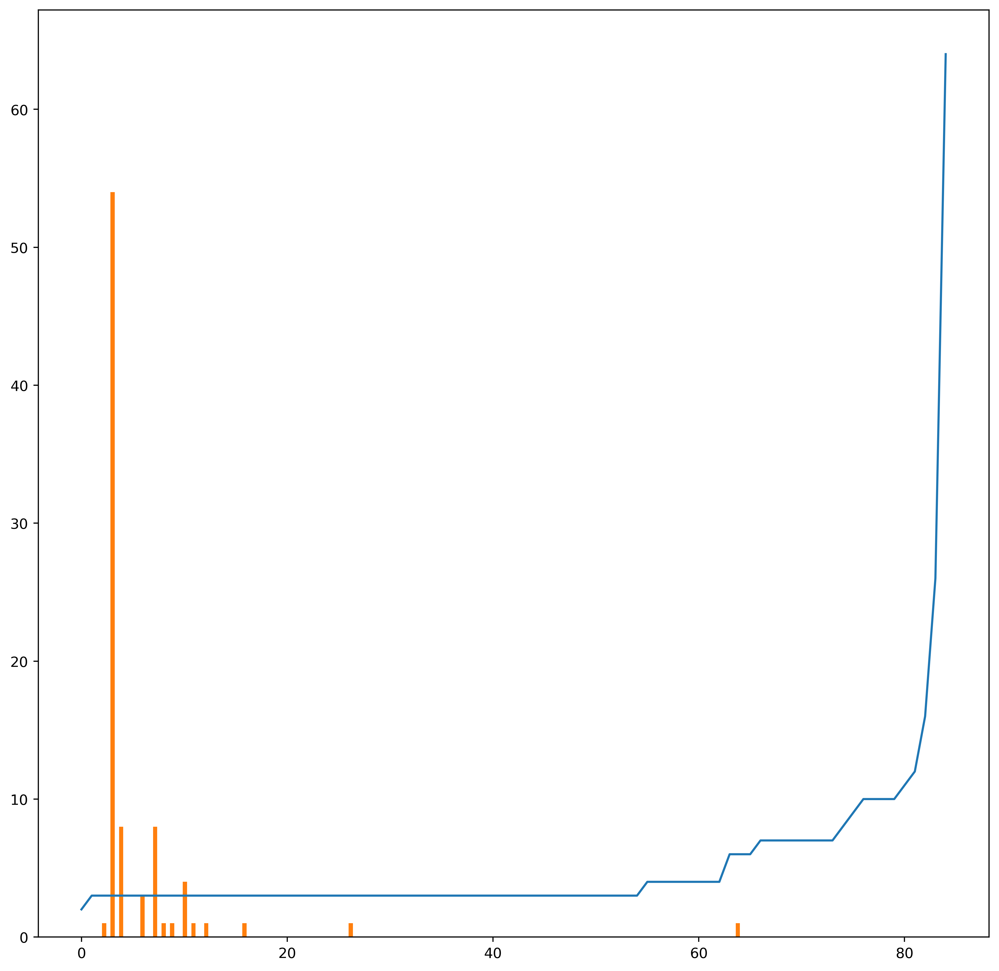

In [366]:
# determine pixel width and height from above edge detection
height = len(data[0])
padded_py = np.insert(py, 0, 0)
padded_py = np.append(padded_py,height)

print(padded_py)
diff_y = np.diff(padded_py)
sorted_diff_y = sorted(diff_y)
plt.figure(figsize=(12,12), dpi=400)
plt.plot(sorted_diff_y)
freq_y, bin_y, _ = plt.hist(sorted_diff_y, bins=150)
print(freq_y[:5], bin_y[:5])

single_cell_y = sorted_diff_y[:int(sum(freq_y[:5]))]

naive division of width by mean pixel size:  145.92857142857142
11 4
8 3
2 1
3 1
16 5
10 3
64 21
3 1
10 3
3 1
3 1
3 1
10 3
6 2
10 3
3 1
3 1
7 2
3 1
3 1
7 2
3 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
7 2
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
4 1
3 1
3 1
3 1
3 1
7 2
3 1
3 1
3 1
7 2
3 1
6 2
4 1
3 1
3 1
3 1
7 2
3 1
3 1
6 2
3 1
7 2
3 1
7 2
3 1
3 1
3 1
4 1
26 8
9 3
12 4
145


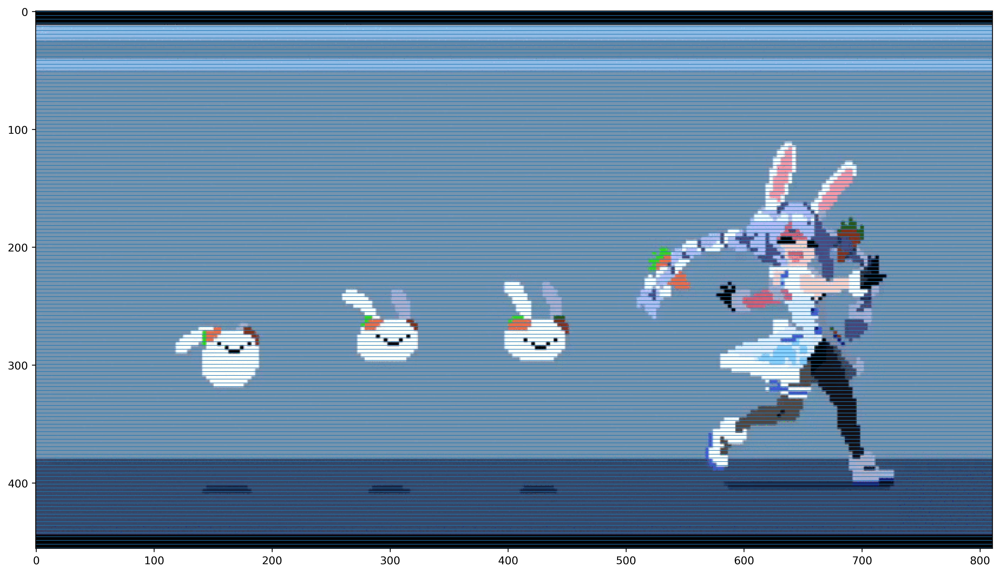

In [375]:
describe(single_cell_y)
mean_h = np.mean(single_cell_y)
height = len(data[0])-1
print("naive division of width by mean pixel size: ", (height-1)/mean_h)

totalh = 0
for i in diff_y:
    print(i, round(i/mean_h))
    totalh += round(i/mean_h)
print(totalh)

plt.figure(figsize=(16,16), dpi=400)
plt.imshow(data[0])

# for l in np.linspace(0, width, num=total+1):
#     plt.axvline(x=l,lw=0.5)

for l in np.linspace(0, height, num=totalh-1):
    plt.axhline(y=l,lw=0.5)

89 52


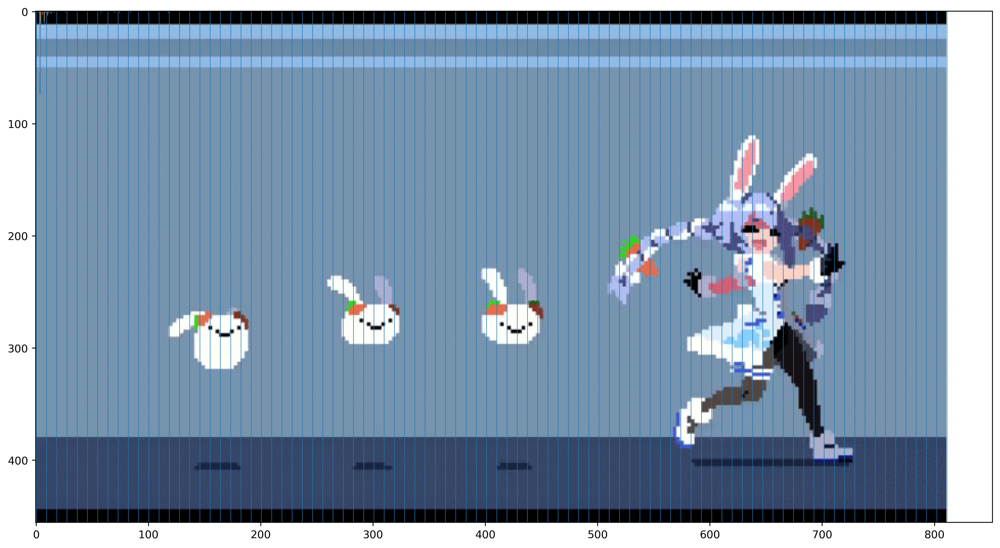

In [353]:
    def get_edges(image):
    height = len(image)
    width = len(image[0])

    gray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
    x = cv.Sobel(gray, cv.CV_32F, 1, 0, ksize=3)
    y = cv.Sobel(gray, cv.CV_32F, 0, 1, ksize=3)

    sx = np.mean(np.abs(x), axis=(0))
    sy = np.mean(np.abs(y), axis=(1))

    px, _ = find_peaks(sx, height=0, threshold=(0.003))
    py, _ = find_peaks(sy, height=0, threshold=(0.003))

    padded_px = np.insert(px, 0, 0)
    padded_px = np.append(padded_px,width)

    padded_py = np.insert(py, 0, 0)
    padded_py = np.append(padded_py,height)

    diff_x = np.diff(padded_px)
    sorted_diff_x = sorted(diff_x)

    diff_y = np.diff(padded_py)
    sorted_diff_y = sorted(diff_y)

    freq_x = plt.hist(sorted_diff_x, bins=150)[0]
    freq_y = plt.hist(sorted_diff_y, bins=150)[0]

    single_x = sorted_diff_x[int(sum(freq_x[:5]))]
    single_y = sorted_diff_y[int(sum(freq_y[:5]))]

    mean_x = np.mean(single_x)
    mean_y = np.mean(single_y)

    xtotal = 0
    for cur in diff_x:
        xtotal += round(cur/mean_x)
    
    ytotal = 0
    for cur in diff_y:
        ytotal += round(cur/mean_y)
    
    return xtotal, ytotal

    

# sobelx, sobely = get_sobel(data[0])
# width = sobel_2_edges(sobelx, axis=0)
# height = sobel_2_edges(sobelx, axis=1)

plt.figure(figsize=(16,16), dpi=400)
plt.imshow(data[0])

height = len(data[0])
width = len(data[0][0])

xtotal, ytotal = get_edges(data[0])
print(xtotal, ytotal)

for l in np.linspace(0, width, num=xtotal+1):
    plt.axvline(x=l,lw=0.5)

for l in np.linspace(0, height, num=ytotal+1):
    plt.axhline(y=l,lw=0.5)

0.0
0.017543859649122806
0.03508771929824561
0.05263157894736842
0.07017543859649122
0.08771929824561403
0.10526315789473684
0.12280701754385964
0.14035087719298245
0.15789473684210525
0.17543859649122806
0.19298245614035087
0.21052631578947367
0.22807017543859648
0.24561403508771928
0.2631578947368421
0.2807017543859649
0.2982456140350877
0.3157894736842105
0.3333333333333333
0.3508771929824561
0.3684210526315789
0.38596491228070173
0.40350877192982454
0.42105263157894735
0.43859649122807015
0.45614035087719296
0.47368421052631576
0.49122807017543857
0.5087719298245614
0.5263157894736842
0.543859649122807
0.5614035087719298
0.5789473684210527
0.5964912280701754
0.6140350877192983
0.631578947368421
0.6491228070175439
0.6666666666666666
0.6842105263157895
0.7017543859649122
0.7192982456140351
0.7368421052631579
0.7543859649122807
0.7719298245614035
0.7894736842105263
0.8070175438596491
0.8245614035087719
0.8421052631578947
0.8596491228070176
0.8771929824561403
0.8947368421052632
0.91228

<Figure size 1600x1600 with 0 Axes>

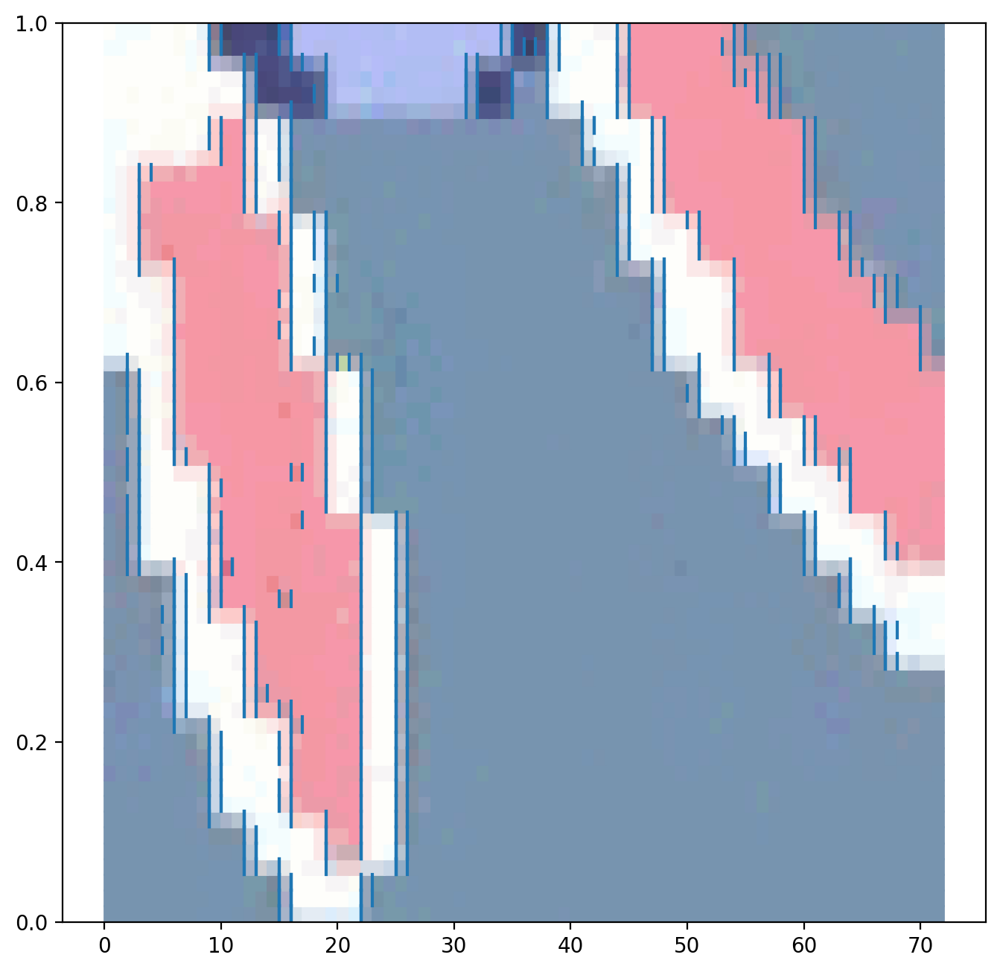

In [173]:
# iterate over every row and col, try to figure out period of discrete function
plt.figure(figsize=(8,8), dpi=200)
# plt.imshow(data[0][295:305,550:700])

fig, ax = plt.subplots(figsize=(8,8), dpi=200)

threshold = 0.10
xmin = 0#550
xmax = 72#700
y = 0#305
ymin = 0#300
yrange = 57
window_width = 1

for y in range(ymin, ymin+yrange):
    print((y-ymin)/yrange)
    row = data[0][y]
    row_length = len(row)
    signals = row.T.reshape((-1, row_length))
    for s in signals:
        segment = s[xmin:xmax]
        ad = np.abs(np.diff(segment))
        # smoothed_ad = np.cumsum(np.insert(ad, 0,0))
        # smoothed_ad = (smoothed_ad[window_width:] - smoothed_ad[:-window_width]) / window_width
        # ax.plot(ad)
        triggered = False
        for i in range(len(ad)):
            if triggered:
                plt.axvline(x=i, ymin=(y-ymin)/yrange,ymax=(y-ymin+1)/yrange)
                triggered = False
            if ad[i] > threshold and not triggered:
                triggered = True
            
        
    # if y == 300:
    for i,r in enumerate(row[xmin:xmax]):
        ax.axvspan(i, i+1, ymin=(y-ymin)/yrange,ymax=(y-ymin+1)/yrange, alpha=1, color=tuple(r))




In [369]:
def proportion_of_image(image, hmin, hmax, wmin, wmax):
    # TODO: Gaussian Kernel smoothing at (mean(hmax,hmin),mean(wmax,wmin)) 
    # print("calling pof with", hmin, hmax, wmin, wmax)
    # print("scaled:", math.ceil(hmin),math.floor(hmax)+1,math.ceil(wmin),math.floor(wmax)+1)
    section = image[math.ceil(hmin):math.floor(hmax)+1,math.ceil(wmin):math.floor(wmax)+1]
    # plt.imshow(section)
    discrete_mean = np.mean(section, 
        axis=(0,1), dtype=np.float32)
    return discrete_mean

def generate_pixel(image, h, w):
    height = len(image)
    width = len(image[0])

    hl = np.linspace(0,height,num=h+1)
    wl = np.linspace(0,width,num=w+1)
    
    res = np.zeros((h,w,3), dtype=np.float32)
    
    for rh in range(h):
        for rw in range(w):
            # print(rh,rw)
            res[rh,rw] = proportion_of_image(cur_image, hl[rh], hl[rh+1], wl[rw], wl[rw+1])
        #     break
        # break

    return res

def visualise_grid(image,h,w):
    height = len(image)
    width = len(image[0])

    hl = np.linspace(0,height,num=h+1)
    wl = np.linspace(0,width,num=w+1)

    plt.figure(figsize=(8,8), dpi=200)
    plt.imshow(image)
    for vl in wl:
        plt.axvline(x=vl-0.5,lw=0.5)
    for hl in hl:
        plt.axhline(y=hl-0.5,lw=0.5)
    for rh in range(h):
        for rw in range(w):
            highlight_grid(image, hl[rh], hl[rh+1], wl[rw], wl[rw+1])

def highlight_grid(image, hmin, hmax, wmin, wmax):
    plt.axvspan(math.ceil(hmin)-0.5,math.floor(hmax)+1-0.5,ymin=math.ceil(wmin)-0.5,ymax=math.floor(wmax)+1-0.5)



In [153]:
one_pixel_wr = [2,4]
one_pixel_hr = [2,4]
height = len(data[0])
width = len(data[0][0])

hr = [height//h for h in one_pixel_hr][::-1]
wr = [width//w for w in one_pixel_wr][::-1]
print(hr, wr)


cur_image = data[0][:,:,:-1]
print(cur_image.shape)
max_score = 0
max_width = 0
max_height = 0

for h in range(hr[0], hr[1]):
    for w in range(wr[0], wr[1]):
        # scale grid to this pixel size
        ha = height/(h)
        wa = width/(w)

        if not 0.99 < ha/wa < 1.01:
            continue

        res = generate_pixel(cur_image, h, w)

        scaled = cv.resize(res, (width, height), interpolation = cv.INTER_AREA)

        cur_gray = cv.cvtColor(cur_image, cv.COLOR_RGB2GRAY)
        scaled_gray = cv.cvtColor(scaled, cv.COLOR_RGB2GRAY)

        score = structural_similarity(cur_gray,scaled_gray)

        # abs_diff = cv.subtract(scaled, data[0], dtype=cv.CV_32F)
        # np.abs(abs_diff, out=abs_diff)
        # plt.figure(figsize=(8,8), dpi=200)
        # plt.imshow(diff)

        if score > max_score:
            max_score = score
            max_width = w
            max_height = h
            print(f"best score: {score}, ({h},{w})")

        


        

        

[14, 29] [18, 36]
(58, 73, 3)
best score: 0.7955082101906837, (15,19)
best score: 0.8504827128004796, (16,20)
best score: 0.8637312771825043, (19,24)
best score: 0.8806973903516582, (23,29)
best score: 0.8905887689927698, (24,30)
best score: 0.8943150181144532, (26,33)
best score: 0.8999716938189235, (27,34)
best score: 0.9056457070705783, (28,35)


In [229]:
# r = generate_pixel(data[0], 28,35)
r = generate_pixel(data[0], 18,23)

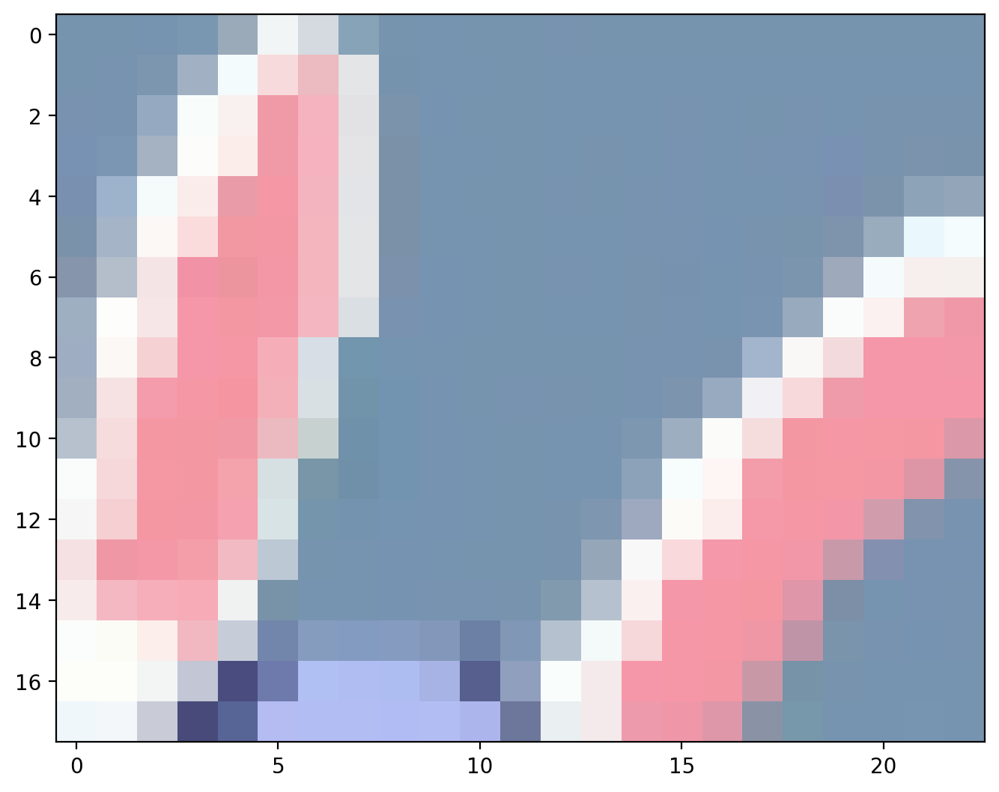

In [230]:
plt.figure(figsize=(8,8), dpi=200)
plt.imshow(r)

IndexError: invalid index to scalar variable.

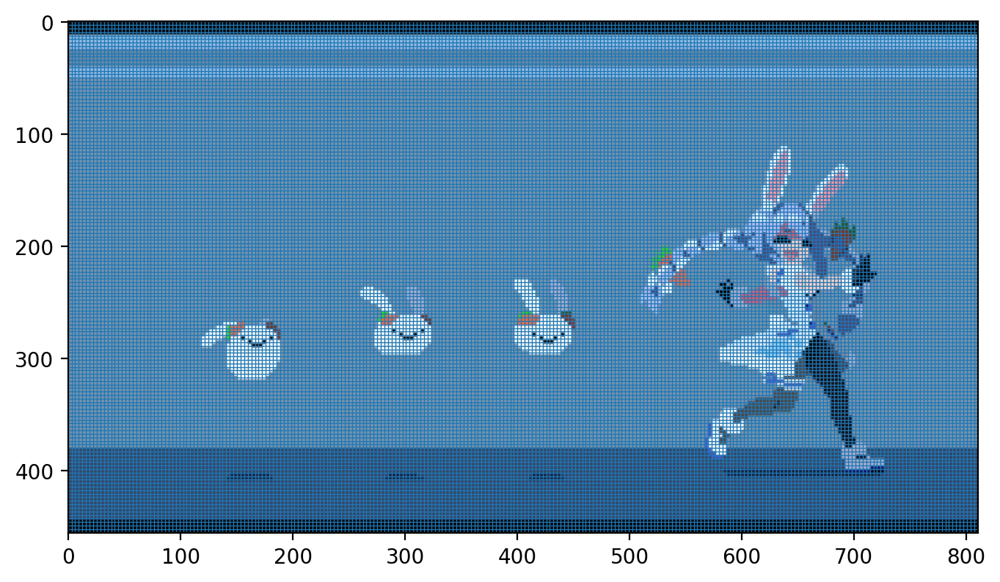

In [370]:
visualise_grid(data[0], 145,253)

In [378]:
# TODO: find squares, get average of all squares, generate grid from one of the selected squares

# use grids found to estimate grid size of image

# fit a sine wave to data, where the interection of each perpendicular line to the sine curve represents a zero
test_data = [i for i in range(15,180,4)]
sliced_x =  test_data[1:9] + test_data[14:]
sliced_y = [0.0 for _ in sliced_x]

# fit the following test data
def fit_data(peaks):
    length = len(peaks)
    y_data = np.zeros(length)

    differences = sorted(np.diff(peaks))
    print(differences)
    period_guess = np.mean(differences[:int(0.8*length)])
    print(period_guess)

    # ny_data = np.ones(length)*-1
    # npeaks = peaks+period_guess/2
    
    def sine(x, a, b):
        return np.sin(b*x+a)

    def shifted_sine(x, a, b=np.pi/period_guess):
        return np.sin(b*x+a)
    
    # params, params_cov = curve_fit(sine, peaks, y_data, p0=[0.1, np.pi/period_guess])
    params, params_cov = curve_fit(shifted_sine, peaks, y_data, p0=[0.1])

    print(params)
    plt.figure(figsize=(8,2), dpi=300)
    plt.scatter(peaks, y_data,s=0.5)
    x_data = np.linspace(np.min(peaks),np.max(peaks), num=1000)
    plt.plot(x_data, shifted_sine(x_data, params[0]), linewidth=0.5)

# fit_data(px)
# Failed...

In [ ]:
colors = data[0].reshape((-1, 3))
print(colors.shape)
clustering = cluster.KMeans(n_clusters=11).fit(colors)
labels = clustering.labels_
# plt.imshow([clustering.cluster_centers_])

In [ ]:
(unique, counts) = np.unique(labels, return_counts=True)
frequencies = np.asarray((unique, counts)).T
# frequencies

In [ ]:
centers = clustering.cluster_centers_
# print(centers)
# plt.imshow([centers])

In [ ]:
relabeled = np.array([centers[l] for l in labels])
clustered_image = relabeled.reshape(data[0].shape)
clustered_res = generate_pixel(clustered_image, y_full_grid, x_full_grid, depth=3)

In [383]:
# plt.figure(figsize=(16,16), dpi=400)
# plt.imshow(clustered_image)

In [384]:
# plt.figure(figsize=(16,16), dpi=400)
# plt.imshow(clustered_res)

In [ ]:
colors_res = res.reshape((-1, 3))
clustering_res = cluster.KMeans(n_clusters=3).fit(colors_res)
relabeled_res = np.array([clustering_res.cluster_centers_[l] for l in clustering_res.labels_])
clustered_image_res = relabeled_res.reshape(res.shape)
# plt.figure(figsize=(16,16), dpi=400)
# plt.imshow(clustered_image_res)

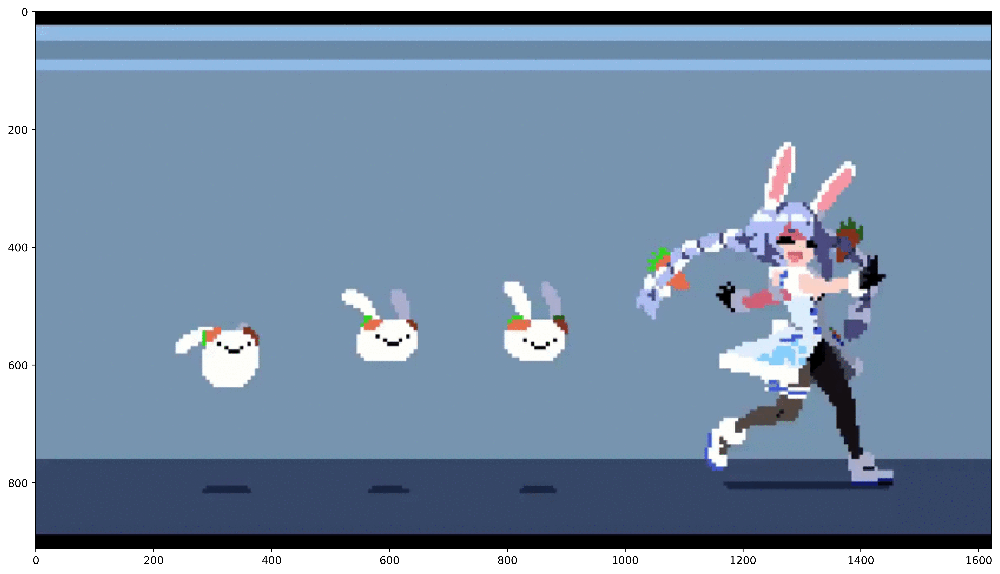

In [386]:
def resize(image, scale=2.0):
    width = int(image.shape[1] * scale)
    height = int(image.shape[0] * scale)
    return cv.resize(image, (width, height), interpolation=cv.INTER_AREA)

resized = resize(data[0])
plt.figure(figsize=(16,16), dpi=400)
plt.imshow(resized)

In [ ]:
x_grid_res, y_grid_res = produce_grid(resized,threshold=None, pixel_min=4, pixel_max=8)
resized_res = generate_pixel(resized, y_grid_res, x_grid_res, depth=3)
print(resized_res.shape)
# plt.figure(figsize=(16,16), dpi=400)
# plt.plot(resized_res)